In [1]:
import torch
import glob
import json
import os

import pandas as pd
import torch
import numpy as np
from sklearn import preprocessing, decomposition, metrics, impute
import torch, torchvision
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
bf_folders = sorted(glob.glob("/proj/haste_berzelius/exps/specs_non_grit_based/*bf*"))[:5]
fl_folders = sorted(glob.glob("/proj/haste_berzelius/exps/specs_non_grit_based/*fl*"))
print(bf_folders, fl_folders)


norm_categories = ["sitenorm", "wellnorm", "dmsonorm", "platenorm"]

exp_cat = "bf_11cls_basic_aug_dmsonorm_750e_sgd"
norm_exp_cats = [exp_cat.replace("dmsonorm", norm_cat) for norm_cat in norm_categories]


['/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1', '/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2', '/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3', '/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4', '/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5'] ['/proj/haste_berzelius/exps/specs_non_grit_based/fl_exps_1_split1', '/proj/haste_berzelius/exps/specs_non_grit_based/fl_exps_1_split2', '/proj/haste_berzelius/exps/specs_non_grit_based/fl_exps_1_split3', '/proj/haste_berzelius/exps/specs_non_grit_based/fl_exps_1_split4', '/proj/haste_berzelius/exps/specs_non_grit_based/fl_exps_1_split5']


In [3]:
import torch.nn as nn


def train_plate_cls(exp_folder, n_labels, train_X, train_Y, test_X, test_Y, mode, model_save_path):
    model = nn.Sequential(
        nn.Linear(672 if mode == "cp" else 2048, 128),
        nn.BatchNorm1d(128),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(128, n_labels),
    )
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters())
    train_dataset = torch.utils.data.TensorDataset(
        torch.from_numpy(train_X).float(), torch.from_numpy(train_Y).long()
    )
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=256, shuffle=True)

    test_dataset = torch.utils.data.TensorDataset(
        torch.from_numpy(test_X).float(), torch.from_numpy(test_Y).long()
    )
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=256, shuffle=False)

    best_accuracy = 0
    accuracies = []
    for i in range(500):
        model.train()
        running_total_loss = 0
        for _, sample in enumerate(train_loader):
            optimizer.zero_grad()
            op = model(sample[0])
            loss = criterion(op, sample[1])
            loss.backward()
            optimizer.step()
            running_total_loss += loss.item()

        if i % 50 == 0:
            model.eval()
            accuracy = 0
            for _, sample in enumerate(test_loader):
                op = model(sample[0])
                loss = criterion(op, sample[1])
                accuracy += (torch.argmax(op, dim=1) == sample[1]).sum().item()
            if accuracy > best_accuracy:
                best_accuracy = accuracy
                torch.save(model.state_dict(), os.path.join(exp_folder, model_save_path))
            print(
                f"Epoch: {i}, Loss: {running_total_loss/ len(test_loader.dataset)}, Accuracy: {accuracy/ len(test_loader.dataset)}"
            )
            accuracies.append(accuracy / len(test_loader.dataset))

    print("Best Accuracy:", np.max(accuracies))
    model.load_state_dict(torch.load(os.path.join(exp_folder, model_save_path)))

    with torch.no_grad():
        model.eval()
        outputs = []
        targets = []
        for _, sample in enumerate(test_loader):
            op = model(sample[0])
            outputs.append(torch.argmax(op, dim=1).cpu().numpy())
            targets.append(sample[1].cpu().numpy())

    a = np.abs(model[0].weight.detach().numpy())
    a = (a - a.min()) / (a.max() - a.min())
    plt.imshow(a, aspect="auto")
    plt.show()
    return outputs, targets


CP Features Plate Effect

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03726035283297227, Accuracy: 0.3185913185913186
Epoch: 50, Loss: 0.003257986222203885, Accuracy: 0.8935298935298935
Epoch: 100, Loss: 0.0014101559422867499, Accuracy: 0.9180999180999181
Epoch: 150, Loss: 0.0014368513542594333, Accuracy: 0.9328419328419328
Epoch: 200, Loss: 0.0009544984415405408, Accuracy: 0.9361179361179361
Epoch: 250, Loss: 0.0007807593929972636, Accuracy: 0.9402129402129402
Epoch: 300, Loss: 0.0010641475118861445, Accuracy: 0.941031941031941
Epoch: 350, Loss: 0.0008022859479002441, Accuracy: 0.9344799344799345
Epoch: 400, Loss: 0.0005061785582938124, Accuracy: 0.9492219492219492
Epoch: 450, Loss: 0.0010425465945749376, Accuracy: 0.941031941031941
Best Accuracy: 0.9492219492219492


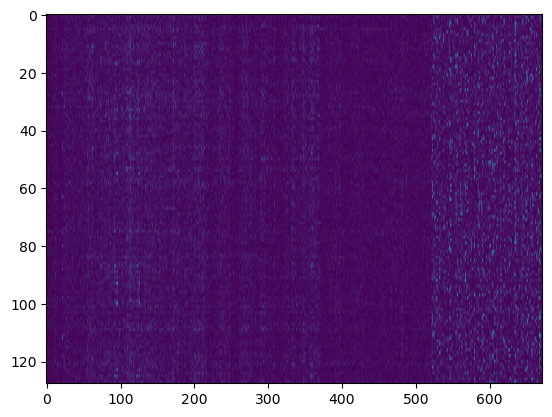

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.036942198665097147, Accuracy: 0.33415233415233414
Epoch: 50, Loss: 0.0031676214313428974, Accuracy: 0.8853398853398854
Epoch: 100, Loss: 0.001570346488340481, Accuracy: 0.9172809172809173
Epoch: 150, Loss: 0.0013898180631415752, Accuracy: 0.9254709254709255
Epoch: 200, Loss: 0.0008909397962198796, Accuracy: 0.9377559377559378
Epoch: 250, Loss: 0.0008378338974875373, Accuracy: 0.9369369369369369
Epoch: 300, Loss: 0.0007886602150476145, Accuracy: 0.9434889434889435
Epoch: 350, Loss: 0.0007561704953926494, Accuracy: 0.9418509418509419
Epoch: 400, Loss: 0.0005104330678780874, Accuracy: 0.95004095004095
Epoch: 450, Loss: 0.0008112847084983464, Accuracy: 0.9459459459459459
Best Accuracy: 0.95004095004095


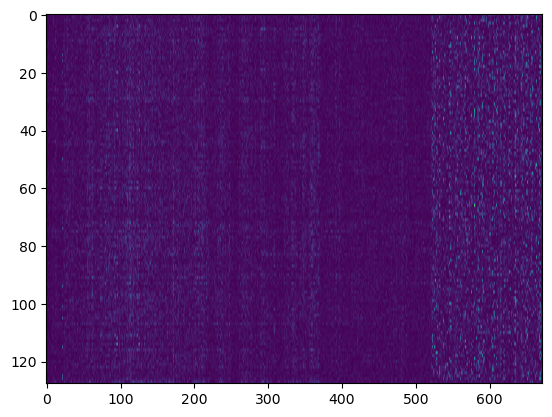

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03618510915645315, Accuracy: 0.35053235053235055
Epoch: 50, Loss: 0.003340737544836127, Accuracy: 0.8902538902538902
Epoch: 100, Loss: 0.0032120111362549443, Accuracy: 0.9107289107289107
Epoch: 150, Loss: 0.001093787216656917, Accuracy: 0.9385749385749386
Epoch: 200, Loss: 0.001053884288297629, Accuracy: 0.9385749385749386
Epoch: 250, Loss: 0.0006256021138198253, Accuracy: 0.9467649467649467
Epoch: 300, Loss: 0.0009213443540408902, Accuracy: 0.9426699426699426
Epoch: 350, Loss: 0.0005964187037178378, Accuracy: 0.941031941031941
Epoch: 400, Loss: 0.0007052398992307259, Accuracy: 0.9492219492219492
Epoch: 450, Loss: 0.0008648968851659066, Accuracy: 0.9451269451269452
Best Accuracy: 0.9492219492219492


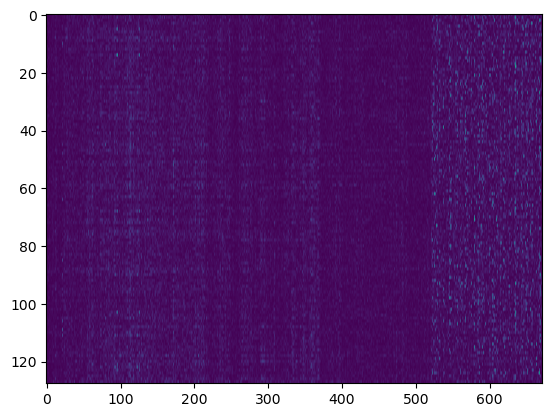

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03694729859666879, Accuracy: 0.33988533988533987
Epoch: 50, Loss: 0.0030302283560809887, Accuracy: 0.8804258804258804
Epoch: 100, Loss: 0.0026185730446273434, Accuracy: 0.8976248976248976
Epoch: 150, Loss: 0.0014042958135149892, Accuracy: 0.9246519246519247
Epoch: 200, Loss: 0.001051116112335894, Accuracy: 0.9393939393939394
Epoch: 250, Loss: 0.000963351931072082, Accuracy: 0.9369369369369369
Epoch: 300, Loss: 0.0007945235855236686, Accuracy: 0.9385749385749386
Epoch: 350, Loss: 0.001032078759187953, Accuracy: 0.9451269451269452
Epoch: 400, Loss: 0.000558973475375398, Accuracy: 0.9484029484029484
Epoch: 450, Loss: 0.0009232701430132309, Accuracy: 0.941031941031941
Best Accuracy: 0.9484029484029484


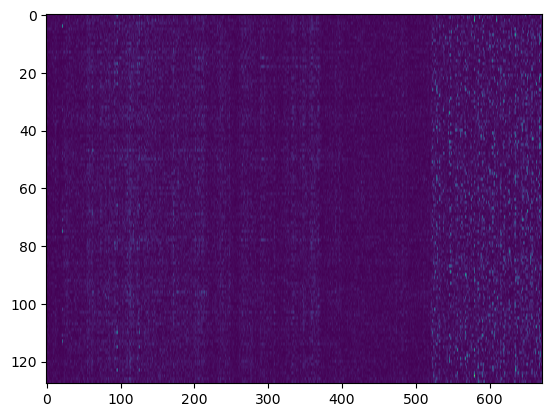

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02999521248808531, Accuracy: 0.37227414330218067
Epoch: 50, Loss: 0.0025777122313359814, Accuracy: 0.8862928348909658
Epoch: 100, Loss: 0.0014682709590482564, Accuracy: 0.9034267912772586
Epoch: 150, Loss: 0.000919223435199892, Accuracy: 0.9190031152647975
Epoch: 200, Loss: 0.0007578064513471082, Accuracy: 0.9228971962616822
Epoch: 250, Loss: 0.001142387266772744, Accuracy: 0.9112149532710281
Epoch: 300, Loss: 0.0004402695403570698, Accuracy: 0.9384735202492211
Epoch: 350, Loss: 0.0007080781589787325, Accuracy: 0.9361370716510904
Epoch: 400, Loss: 0.0008395530886924898, Accuracy: 0.9252336448598131
Epoch: 450, Loss: 0.00036063253722876034, Accuracy: 0.9345794392523364
Best Accuracy: 0.9384735202492211


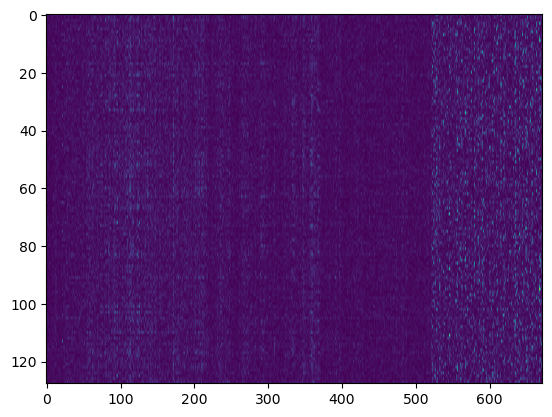

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.030141526757742385, Accuracy: 0.3847352024922118
Epoch: 50, Loss: 0.0032606239421902414, Accuracy: 0.8800623052959502
Epoch: 100, Loss: 0.001212234437651352, Accuracy: 0.9127725856697819
Epoch: 150, Loss: 0.0019001475480208145, Accuracy: 0.9065420560747663
Epoch: 200, Loss: 0.0010728369905059212, Accuracy: 0.9228971962616822
Epoch: 250, Loss: 0.0005966257898723039, Accuracy: 0.9314641744548287
Epoch: 300, Loss: 0.0008758612679218949, Accuracy: 0.92601246105919
Epoch: 350, Loss: 0.00042442510933020497, Accuracy: 0.9361370716510904
Epoch: 400, Loss: 0.0005192031004579268, Accuracy: 0.9462616822429907
Epoch: 450, Loss: 0.0005880377728294732, Accuracy: 0.9338006230529595
Best Accuracy: 0.9462616822429907


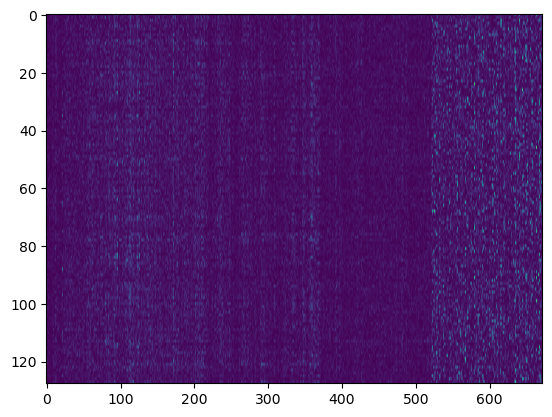

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.030103192151149857, Accuracy: 0.37227414330218067
Epoch: 50, Loss: 0.00235379251689183, Accuracy: 0.8761682242990654
Epoch: 100, Loss: 0.001891964762195991, Accuracy: 0.9049844236760125
Epoch: 150, Loss: 0.0009679713974071441, Accuracy: 0.9338006230529595
Epoch: 200, Loss: 0.0007013326621037035, Accuracy: 0.9322429906542056
Epoch: 250, Loss: 0.0009293327154446614, Accuracy: 0.9345794392523364
Epoch: 300, Loss: 0.00063073287378544, Accuracy: 0.9345794392523364
Epoch: 350, Loss: 0.0005364458154991408, Accuracy: 0.940809968847352
Epoch: 400, Loss: 0.0005058006055629885, Accuracy: 0.942367601246106
Epoch: 450, Loss: 0.0005293968742904819, Accuracy: 0.942367601246106
Best Accuracy: 0.942367601246106


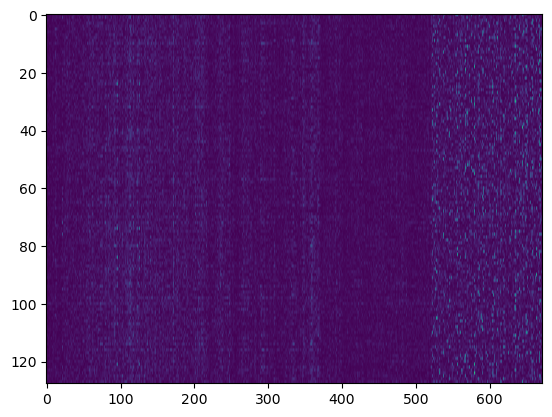

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.030266005580670365, Accuracy: 0.3691588785046729
Epoch: 50, Loss: 0.0024123307479969065, Accuracy: 0.9003115264797508
Epoch: 100, Loss: 0.0012124539019302044, Accuracy: 0.9174454828660437
Epoch: 150, Loss: 0.0013075257068343251, Accuracy: 0.9174454828660437
Epoch: 200, Loss: 0.0009661201863459709, Accuracy: 0.9236760124610592
Epoch: 250, Loss: 0.0010966610981621475, Accuracy: 0.9190031152647975
Epoch: 300, Loss: 0.0006553955909990448, Accuracy: 0.9322429906542056
Epoch: 350, Loss: 0.0006306669979451973, Accuracy: 0.9330218068535826
Epoch: 400, Loss: 0.00048510749270193673, Accuracy: 0.940809968847352
Epoch: 450, Loss: 0.000527988228587161, Accuracy: 0.9338006230529595
Best Accuracy: 0.940809968847352


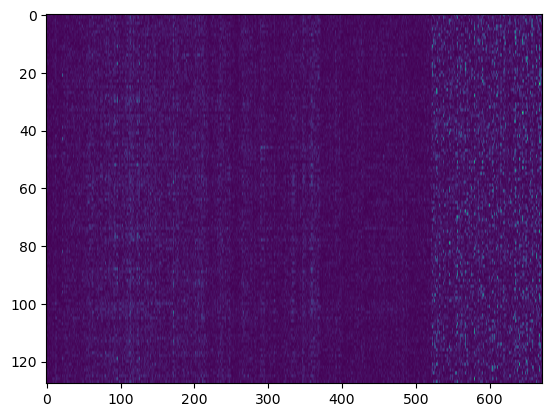

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.035164042632668806, Accuracy: 0.34074662430500396
Epoch: 50, Loss: 0.003740418717158608, Accuracy: 0.8729150119142176
Epoch: 100, Loss: 0.002049270564597026, Accuracy: 0.9102462271644162
Epoch: 150, Loss: 0.0021063954797976544, Accuracy: 0.9181890389197777
Epoch: 200, Loss: 0.001205371550748138, Accuracy: 0.9229547259729944
Epoch: 250, Loss: 0.000976661026383128, Accuracy: 0.9293089753772835
Epoch: 300, Loss: 0.001360486044805139, Accuracy: 0.931691818903892
Epoch: 350, Loss: 0.001012297212556774, Accuracy: 0.9364575059571089
Epoch: 400, Loss: 0.0006533382642449037, Accuracy: 0.938046068308181
Epoch: 450, Loss: 0.00068218404807393, Accuracy: 0.9499602859412232
Best Accuracy: 0.9499602859412232


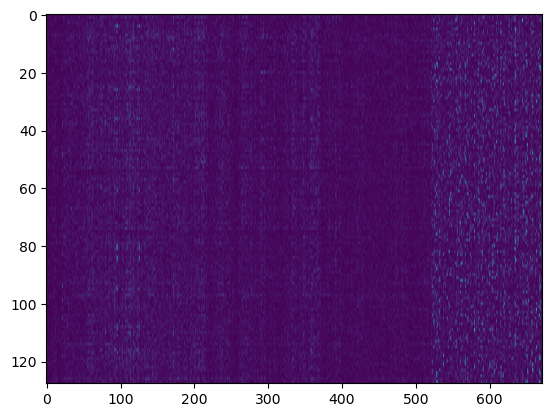

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.035861030090792584, Accuracy: 0.32486100079428115
Epoch: 50, Loss: 0.004179793219892064, Accuracy: 0.8784749801429707
Epoch: 100, Loss: 0.0025373334812208996, Accuracy: 0.9023034154090548
Epoch: 150, Loss: 0.002181932466242217, Accuracy: 0.9221604447974583
Epoch: 200, Loss: 0.0014324064963483166, Accuracy: 0.9237490071485306
Epoch: 250, Loss: 0.0017238291064787705, Accuracy: 0.9237490071485306
Epoch: 300, Loss: 0.0010992547821155893, Accuracy: 0.9404289118347895
Epoch: 350, Loss: 0.0012891176108617078, Accuracy: 0.9332803812549643
Epoch: 400, Loss: 0.0012283491339117312, Accuracy: 0.9364575059571089
Epoch: 450, Loss: 0.0008543633528178035, Accuracy: 0.9436060365369341
Best Accuracy: 0.9436060365369341


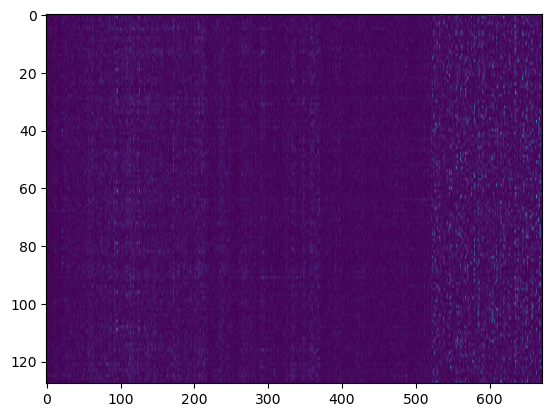

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03548231619137256, Accuracy: 0.363780778395552
Epoch: 50, Loss: 0.005154176824522738, Accuracy: 0.8776806989674345
Epoch: 100, Loss: 0.0025766173095055473, Accuracy: 0.9046862589356632
Epoch: 150, Loss: 0.0025709247937081257, Accuracy: 0.9102462271644162
Epoch: 200, Loss: 0.0016450151339516552, Accuracy: 0.9269261318506752
Epoch: 250, Loss: 0.000905003892797814, Accuracy: 0.9332803812549643
Epoch: 300, Loss: 0.0011229406157545478, Accuracy: 0.9332803812549643
Epoch: 350, Loss: 0.0017146653154712522, Accuracy: 0.9181890389197777
Epoch: 400, Loss: 0.0012938204126002014, Accuracy: 0.9301032565528197
Epoch: 450, Loss: 0.000978266903161529, Accuracy: 0.9340746624305004
Best Accuracy: 0.9340746624305004


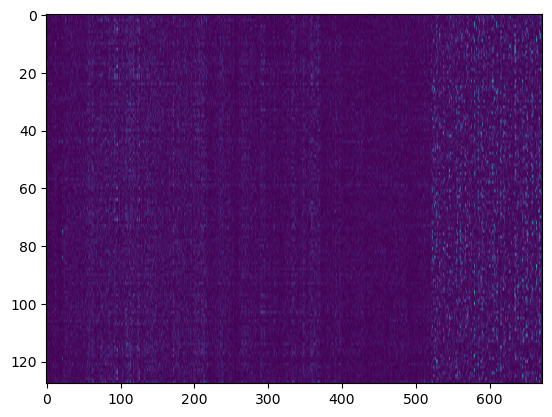

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03559748751478976, Accuracy: 0.34630659253375695
Epoch: 50, Loss: 0.0036892430639342715, Accuracy: 0.8816521048451151
Epoch: 100, Loss: 0.0020334573079424305, Accuracy: 0.9213661636219221
Epoch: 150, Loss: 0.0015096706918916406, Accuracy: 0.931691818903892
Epoch: 200, Loss: 0.0015066429629412978, Accuracy: 0.926131850675139
Epoch: 250, Loss: 0.0012549164366920946, Accuracy: 0.9332803812549643
Epoch: 300, Loss: 0.001105584192361218, Accuracy: 0.9396346306592533
Epoch: 350, Loss: 0.0008784366699085054, Accuracy: 0.9436060365369341
Epoch: 400, Loss: 0.0009084013146455559, Accuracy: 0.9388403494837172
Epoch: 450, Loss: 0.0010284667773981526, Accuracy: 0.9428117553613979
Best Accuracy: 0.9436060365369341


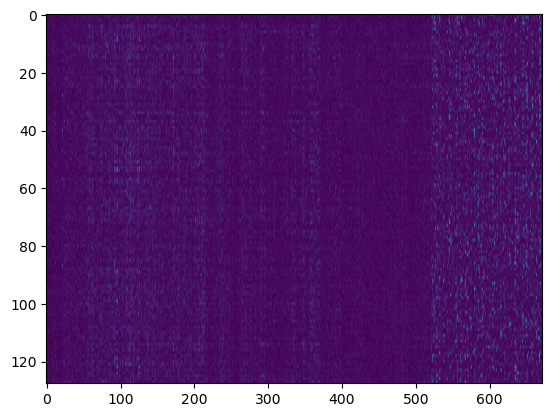

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03088818338646251, Accuracy: 0.39012738853503187
Epoch: 50, Loss: 0.001894306160129939, Accuracy: 0.9171974522292994
Epoch: 100, Loss: 0.0014292802809957106, Accuracy: 0.9211783439490446
Epoch: 150, Loss: 0.0009128388319947537, Accuracy: 0.9394904458598726
Epoch: 200, Loss: 0.0006009672626046238, Accuracy: 0.9434713375796179
Epoch: 250, Loss: 0.0004924867038205741, Accuracy: 0.946656050955414
Epoch: 300, Loss: 0.0005688979349745686, Accuracy: 0.946656050955414
Epoch: 350, Loss: 0.0004419045327053328, Accuracy: 0.9394904458598726
Epoch: 400, Loss: 0.0004533664842438736, Accuracy: 0.947452229299363
Epoch: 450, Loss: 0.0006063480914872923, Accuracy: 0.945859872611465
Best Accuracy: 0.947452229299363


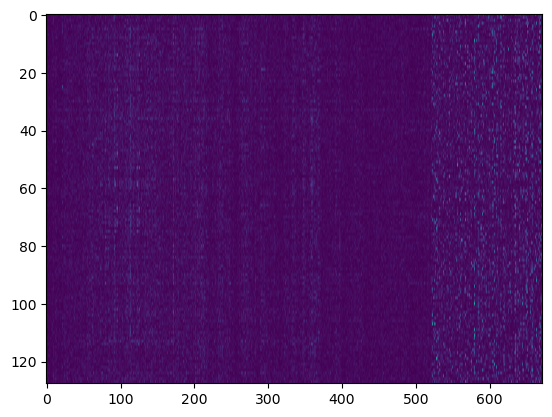

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.030758240420347565, Accuracy: 0.42277070063694266
Epoch: 50, Loss: 0.002044167731455557, Accuracy: 0.9132165605095541
Epoch: 100, Loss: 0.0007899948069529168, Accuracy: 0.9299363057324841
Epoch: 150, Loss: 0.0006974257505053927, Accuracy: 0.9347133757961783
Epoch: 200, Loss: 0.0004592621446865949, Accuracy: 0.9418789808917197
Epoch: 250, Loss: 0.0004318868726563112, Accuracy: 0.9410828025477707
Epoch: 300, Loss: 0.0003684028778462463, Accuracy: 0.9530254777070064
Epoch: 350, Loss: 0.0003854805369309749, Accuracy: 0.9530254777070064
Epoch: 400, Loss: 0.0003917815056584989, Accuracy: 0.9498407643312102
Epoch: 450, Loss: 0.00024212434165666151, Accuracy: 0.9554140127388535
Best Accuracy: 0.9554140127388535


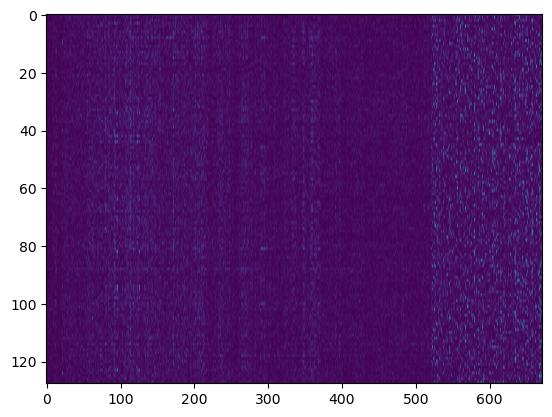

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.03110838857046358, Accuracy: 0.39012738853503187
Epoch: 50, Loss: 0.0024212683628129354, Accuracy: 0.8988853503184714
Epoch: 100, Loss: 0.0009515410953551341, Accuracy: 0.928343949044586
Epoch: 150, Loss: 0.00086820694012864, Accuracy: 0.9418789808917197
Epoch: 200, Loss: 0.0006679296389720432, Accuracy: 0.9410828025477707
Epoch: 250, Loss: 0.0006400507765045022, Accuracy: 0.9386942675159236
Epoch: 300, Loss: 0.000702703614114149, Accuracy: 0.9442675159235668
Epoch: 350, Loss: 0.0005587539205529318, Accuracy: 0.9394904458598726
Epoch: 400, Loss: 0.0003004258170065464, Accuracy: 0.9490445859872612
Epoch: 450, Loss: 0.00041259523439606666, Accuracy: 0.9530254777070064
Best Accuracy: 0.9530254777070064


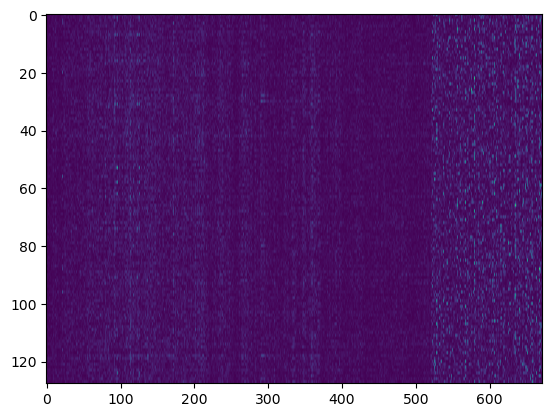

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.0310578187749644, Accuracy: 0.4171974522292994
Epoch: 50, Loss: 0.0021977552515306292, Accuracy: 0.9012738853503185
Epoch: 100, Loss: 0.0010482649479037637, Accuracy: 0.9323248407643312
Epoch: 150, Loss: 0.0006972100099275826, Accuracy: 0.9442675159235668
Epoch: 200, Loss: 0.0005356667023508032, Accuracy: 0.9410828025477707
Epoch: 250, Loss: 0.0006853572855211178, Accuracy: 0.946656050955414
Epoch: 300, Loss: 0.00036733629809289125, Accuracy: 0.9418789808917197
Epoch: 350, Loss: 0.0005794548129983199, Accuracy: 0.9418789808917197
Epoch: 400, Loss: 0.0006594944309300868, Accuracy: 0.9371019108280255
Epoch: 450, Loss: 0.0003872086081926705, Accuracy: 0.9482484076433121
Best Accuracy: 0.9482484076433121


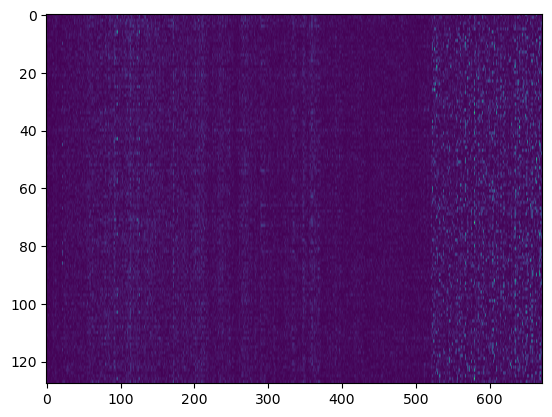

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.01936394245151708, Accuracy: 0.3462749213011542
Epoch: 50, Loss: 0.0014658108126891997, Accuracy: 0.8824763903462749
Epoch: 100, Loss: 0.000845531760035757, Accuracy: 0.9060860440713536
Epoch: 150, Loss: 0.0003722467882889015, Accuracy: 0.9281217208814271
Epoch: 200, Loss: 0.0004645179789063813, Accuracy: 0.9359916054564533
Epoch: 250, Loss: 0.0003400983548833591, Accuracy: 0.9365162644281217
Epoch: 300, Loss: 0.0004476257438643407, Accuracy: 0.9401888772298006
Epoch: 350, Loss: 0.00019125180203635695, Accuracy: 0.9496327387198321
Epoch: 400, Loss: 0.00015991489409790583, Accuracy: 0.9501573976915005
Epoch: 450, Loss: 0.0002538068454560178, Accuracy: 0.9454354669464848
Best Accuracy: 0.9501573976915005


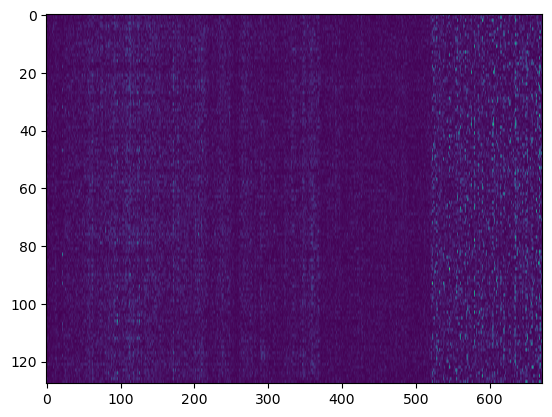

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.018871839311665778, Accuracy: 0.3567681007345226
Epoch: 50, Loss: 0.001237003064293176, Accuracy: 0.8950682056663168
Epoch: 100, Loss: 0.000811252709779134, Accuracy: 0.9150052465897167
Epoch: 150, Loss: 0.00040657881252537993, Accuracy: 0.9312696747114375
Epoch: 200, Loss: 0.000293239225034386, Accuracy: 0.944386149003148
Epoch: 250, Loss: 0.00022509906896373406, Accuracy: 0.9475341028331584
Epoch: 300, Loss: 0.0005763702325186725, Accuracy: 0.9375655823714586
Epoch: 350, Loss: 0.0002025447068550279, Accuracy: 0.9538300104931794
Epoch: 400, Loss: 0.0002743698815851309, Accuracy: 0.9475341028331584
Epoch: 450, Loss: 0.00020229828603573512, Accuracy: 0.9554039874081847
Best Accuracy: 0.9554039874081847


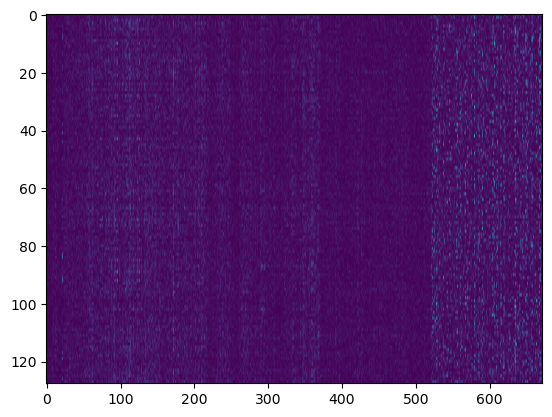

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.01936537033613431, Accuracy: 0.3551941238195173
Epoch: 50, Loss: 0.001219654195831555, Accuracy: 0.8845750262329486
Epoch: 100, Loss: 0.0006139216766715174, Accuracy: 0.9307450157397692
Epoch: 150, Loss: 0.00034846489660731144, Accuracy: 0.9459601259181531
Epoch: 200, Loss: 0.000481966076709979, Accuracy: 0.9365162644281217
Epoch: 250, Loss: 0.000293157723070692, Accuracy: 0.9522560335781742
Epoch: 300, Loss: 0.00027866656075994966, Accuracy: 0.9454354669464848
Epoch: 350, Loss: 0.00020850179736489765, Accuracy: 0.959601259181532
Epoch: 400, Loss: 0.0001791318050797751, Accuracy: 0.9527806925498427
Epoch: 450, Loss: 0.00028741948017293485, Accuracy: 0.9580272822665268
Best Accuracy: 0.959601259181532


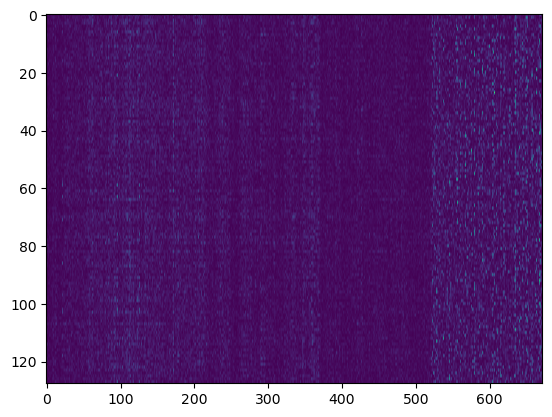

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.019443222445681113, Accuracy: 0.33630640083945434
Epoch: 50, Loss: 0.0014707383945005764, Accuracy: 0.8803777544596013
Epoch: 100, Loss: 0.0006849578027647665, Accuracy: 0.9197271773347324
Epoch: 150, Loss: 0.000471660967013268, Accuracy: 0.9333683105981112
Epoch: 200, Loss: 0.00043337094985488076, Accuracy: 0.938090241343127
Epoch: 250, Loss: 0.00023300192931594653, Accuracy: 0.9485834207764953
Epoch: 300, Loss: 0.0002841380095463109, Accuracy: 0.94700944386149
Epoch: 350, Loss: 0.0002150231848225576, Accuracy: 0.9512067156348374
Epoch: 400, Loss: 0.00018822925667603895, Accuracy: 0.9548793284365162
Epoch: 450, Loss: 0.0002170212733962916, Accuracy: 0.9512067156348374
Best Accuracy: 0.9548793284365162


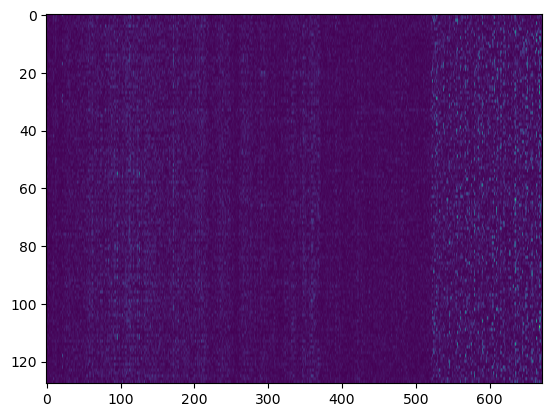

In [4]:
cp_df_cell = pd.read_csv("stats/non_grit_based/CP_features_cells.csv")
site_conversion = pd.DataFrame(
    {"bf_sites": ["s1", "s2", "s3", "s4", "s5"], "f_sites": ["s2", "s4", "s5", "s6", "s8"]}
)

feature_groups = [
    "AreaShape",
    "Correlation",
    "Granularity",
    "Intensity",
    "Neighbors",
    "RadialDistribution",
]
cp_feature_columns = [c for c in cp_df_cell.columns if c.startswith(tuple(feature_groups))]

for bf_folder in bf_folders:
    for norm_exp_cat in norm_exp_cats:
        exp_folder = os.path.join(bf_folder, norm_exp_cat, "ResNet_resnet50")
        print(exp_folder)
        if os.path.exists(exp_folder):
            model_train_df = pd.read_csv(os.path.join(exp_folder, "feature_data_train.csv"))
            model_train_df = model_train_df[model_train_df["moa"] != "dmso"]
            model_train_df["site"] = model_train_df["site"].map(
                site_conversion.set_index("bf_sites")["f_sites"]
            )
            cp_bf_df = pd.merge(
                model_train_df, cp_df_cell, on=["plate", "well", "compound", "moa", "site"]
            )
            cp_train_df = cp_bf_df[cp_df_cell.columns]

            model_test_df = pd.read_csv(os.path.join(exp_folder, "feature_data_test.csv"))
            model_test_df = model_test_df[model_test_df["moa"] != "dmso"]
            model_test_df["site"] = model_test_df["site"].map(
                site_conversion.set_index("bf_sites")["f_sites"]
            )
            cp_bf_df = pd.merge(
                model_test_df, cp_df_cell, on=["plate", "well", "compound", "moa", "site"]
            )
            cp_test_df = cp_bf_df[cp_df_cell.columns]

            # test_unique_plates = np.unique(cp_test_df["plate"])
            # n_labels = len(test_unique_plates)
            # cp_train_df = cp_train_df[cp_train_df["plate"].isin(test_unique_plates)]
            # train_unique_plates = np.unique(cp_train_df["plate"])
            # n_labels = len(train_unique_plates)

            test_unique_plates = np.unique(cp_test_df["plate"])
            train_unique_plates = np.unique(cp_train_df["plate"])
            common_plates = list(set(test_unique_plates).intersection(train_unique_plates))
            n_labels = len(common_plates)
            cp_train_df = cp_train_df[cp_train_df["plate"].isin(common_plates)]
            cp_test_df = cp_test_df[cp_test_df["plate"].isin(common_plates)]

            le = preprocessing.LabelEncoder()
            le.fit(cp_train_df["plate"])

            # train_plate_labels = le.transform(cp_train_df["plate"])
            cp_train_df["plate_label"] = cp_train_df["plate"].apply(lambda x: le.transform([x])[0].item())
            #  list(train_plate_labels)
            # le.transform(cp_train_df["plate"])
            # test_plate_labels = le.transform(cp_test_df["plate"])
            cp_test_df["plate_label"] = cp_test_df["plate"].apply(lambda x: le.transform([x])[0].item())
            # le.transform(cp_test_df["plate"])


            train_X = cp_train_df[cp_feature_columns].values
            imputer = impute.SimpleImputer(missing_values=np.nan, strategy='mean').fit(train_X)
            train_X = imputer.transform(train_X)
            normalize = preprocessing.StandardScaler().fit(train_X)
            train_X = normalize.transform(train_X)
            train_Y = cp_train_df["plate_label"].values

            test_X = cp_test_df[cp_feature_columns].values
            test_X = imputer.transform(test_X)
            test_X = normalize.transform(test_X)
            test_Y = cp_test_df["plate_label"].values

            outputs, targets = train_plate_cls(
                exp_folder, n_labels, train_X, train_Y, test_X, test_Y, "cp", "cp_10cls_plate_effect.pth"
            )

            pred_plate = le.inverse_transform(np.concatenate(outputs))
            plate = le.inverse_transform(np.concatenate(targets))

            report = metrics.classification_report(plate, pred_plate, output_dict=True)
            report_df = pd.DataFrame(report).transpose()
            report_df.to_csv(os.path.join(exp_folder, "cp_10cls_plate_effect_report.csv"))

            df = pd.DataFrame(
                {
                    "plate": plate,
                    "predicted_plate": pred_plate,
                    "well": cp_test_df["well"].values,
                    "site": cp_test_df["site"].values,
                    "compound": cp_test_df["compound"].values,
                    "moa": cp_test_df["moa"].values,
                }
            )
            df.to_csv(os.path.join(exp_folder, "cp_10cls_plate_effect.csv"), index=False)


Model Features Plate Effect

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02160765031973521, Accuracy: 0.5597222222222222
Epoch: 50, Loss: 0.0025663642005787956, Accuracy: 0.6465277777777778
Epoch: 100, Loss: 0.001570051805012756, Accuracy: 0.6430555555555556
Epoch: 150, Loss: 0.0009768572920519445, Accuracy: 0.65
Epoch: 200, Loss: 0.00071792749222368, Accuracy: 0.64375
Epoch: 250, Loss: 0.000624465312446571, Accuracy: 0.6513888888888889
Epoch: 300, Loss: 0.0006305534909996722, Accuracy: 0.6458333333333334
Epoch: 350, Loss: 0.0006476604470258785, Accuracy: 0.6479166666666667
Epoch: 400, Loss: 0.0005653641923951606, Accuracy: 0.6486111111111111
Epoch: 450, Loss: 0.0004463100443697638, Accuracy: 0.6472222222222223
Best Accuracy: 0.6513888888888889


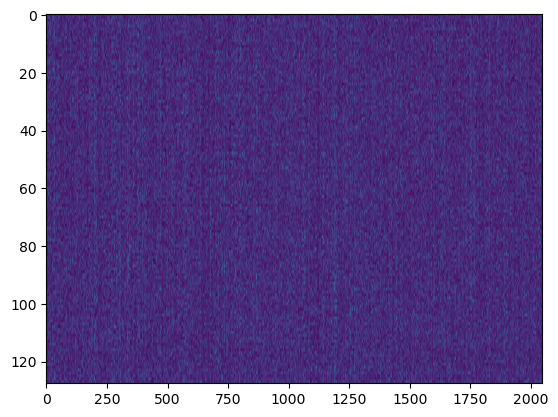

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.021461567531029384, Accuracy: 0.55625
Epoch: 50, Loss: 0.0018675710747225417, Accuracy: 0.6430555555555556
Epoch: 100, Loss: 0.0010478691379022266, Accuracy: 0.6416666666666667
Epoch: 150, Loss: 0.0006363833762912287, Accuracy: 0.6381944444444444
Epoch: 200, Loss: 0.000498036494375103, Accuracy: 0.6493055555555556
Epoch: 250, Loss: 0.00047164893152916595, Accuracy: 0.6430555555555556
Epoch: 300, Loss: 0.00043014943625571, Accuracy: 0.6381944444444444
Epoch: 350, Loss: 0.00041930818438736927, Accuracy: 0.6430555555555556
Epoch: 400, Loss: 0.0003456947697688722, Accuracy: 0.6354166666666666
Epoch: 450, Loss: 0.00033646745982372924, Accuracy: 0.6381944444444444
Best Accuracy: 0.6493055555555556


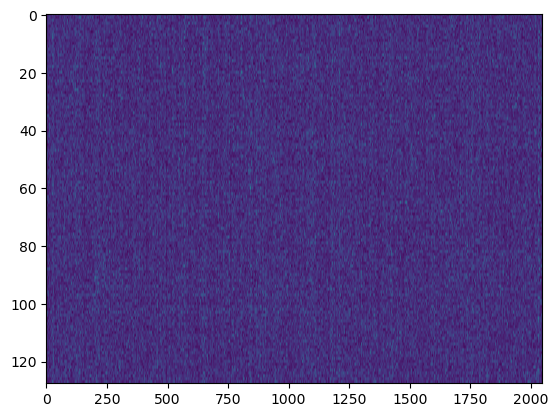

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.016069593901435534, Accuracy: 0.8576388888888888
Epoch: 50, Loss: 0.00035530166609937117, Accuracy: 0.9173611111111111
Epoch: 100, Loss: 0.0001949824586821099, Accuracy: 0.9194444444444444
Epoch: 150, Loss: 0.0001673919550537701, Accuracy: 0.9208333333333333
Epoch: 200, Loss: 9.842933181466327e-05, Accuracy: 0.9145833333333333
Epoch: 250, Loss: 0.00010626831038583381, Accuracy: 0.9159722222222222
Epoch: 300, Loss: 7.277169732131168e-05, Accuracy: 0.9166666666666666
Epoch: 350, Loss: 6.244847221144785e-05, Accuracy: 0.9166666666666666
Epoch: 400, Loss: 3.505598174847869e-05, Accuracy: 0.9125
Epoch: 450, Loss: 9.498733545317211e-05, Accuracy: 0.9104166666666667
Best Accuracy: 0.9208333333333333


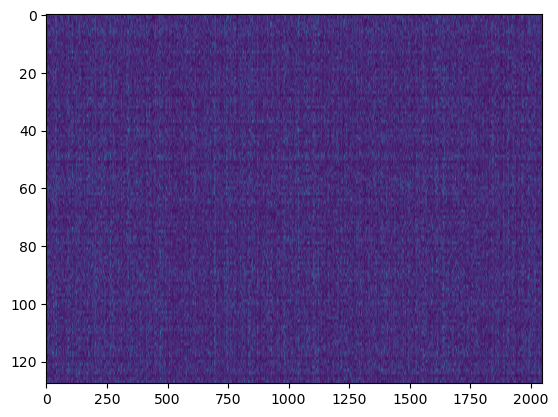

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split1/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.017036945165859328, Accuracy: 0.79375
Epoch: 50, Loss: 0.0003542912774719298, Accuracy: 0.8736111111111111
Epoch: 100, Loss: 0.00019357664956866453, Accuracy: 0.8743055555555556
Epoch: 150, Loss: 9.981612545541591e-05, Accuracy: 0.8777777777777778
Epoch: 200, Loss: 0.00014728291733061066, Accuracy: 0.88125
Epoch: 250, Loss: 9.755412401217554e-05, Accuracy: 0.88125
Epoch: 300, Loss: 5.124086233586746e-05, Accuracy: 0.8826388888888889
Epoch: 350, Loss: 8.940184650580502e-05, Accuracy: 0.8756944444444444
Epoch: 400, Loss: 6.803776755582981e-05, Accuracy: 0.875
Epoch: 450, Loss: 4.004221686449859e-05, Accuracy: 0.8763888888888889
Best Accuracy: 0.8826388888888889


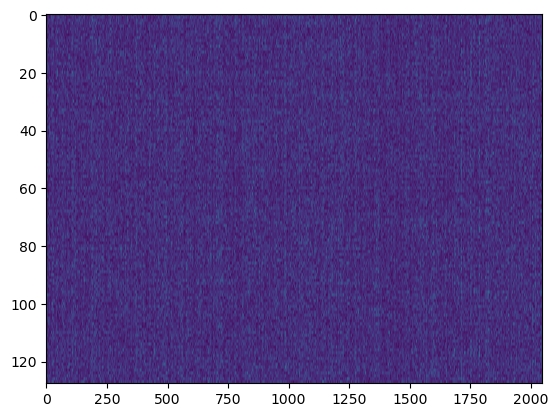

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02046956464546878, Accuracy: 0.682312925170068
Epoch: 50, Loss: 0.0020607160771785138, Accuracy: 0.7721088435374149
Epoch: 100, Loss: 0.0013508411289072362, Accuracy: 0.7693877551020408
Epoch: 150, Loss: 0.0007305226561163558, Accuracy: 0.7707482993197279
Epoch: 200, Loss: 0.0006418208331883359, Accuracy: 0.7687074829931972
Epoch: 250, Loss: 0.0004813883770383945, Accuracy: 0.7748299319727892
Epoch: 300, Loss: 0.0005208147835417264, Accuracy: 0.773469387755102
Epoch: 350, Loss: 0.0005433947114007814, Accuracy: 0.7748299319727892
Epoch: 400, Loss: 0.00037573506155995286, Accuracy: 0.7721088435374149
Epoch: 450, Loss: 0.0003236462381117198, Accuracy: 0.7741496598639456
Best Accuracy: 0.7748299319727892


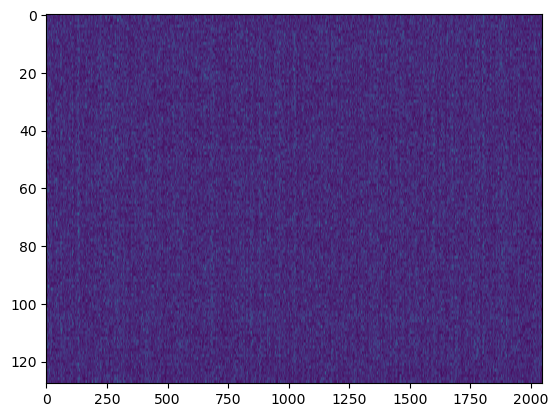

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02107917143374073, Accuracy: 0.601360544217687
Epoch: 50, Loss: 0.0019658923706635328, Accuracy: 0.691156462585034
Epoch: 100, Loss: 0.0011064746296730172, Accuracy: 0.689795918367347
Epoch: 150, Loss: 0.0008455654340130942, Accuracy: 0.691156462585034
Epoch: 200, Loss: 0.0005043068026401559, Accuracy: 0.7054421768707483
Epoch: 250, Loss: 0.0005626324576889577, Accuracy: 0.691156462585034
Epoch: 300, Loss: 0.00046922860375675214, Accuracy: 0.6904761904761905
Epoch: 350, Loss: 0.0004106351408828683, Accuracy: 0.7
Epoch: 400, Loss: 0.0004262144842064705, Accuracy: 0.7013605442176871
Epoch: 450, Loss: 0.00037889426738834704, Accuracy: 0.6986394557823129
Best Accuracy: 0.7054421768707483


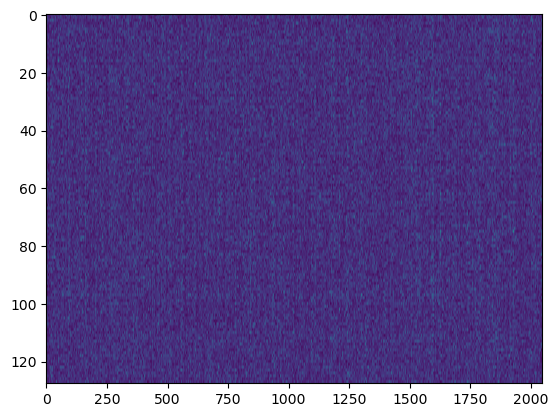

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.016473220278616665, Accuracy: 0.8938775510204081
Epoch: 50, Loss: 0.0003400047201992703, Accuracy: 0.9482993197278912
Epoch: 100, Loss: 0.00016910590399310093, Accuracy: 0.9523809523809523
Epoch: 150, Loss: 0.00014398203621029246, Accuracy: 0.9489795918367347
Epoch: 200, Loss: 9.915396107081957e-05, Accuracy: 0.954421768707483
Epoch: 250, Loss: 7.024068792420281e-05, Accuracy: 0.95578231292517
Epoch: 300, Loss: 4.732696597660784e-05, Accuracy: 0.9537414965986395
Epoch: 350, Loss: 6.617134168497002e-05, Accuracy: 0.9510204081632653
Epoch: 400, Loss: 9.579300527226458e-05, Accuracy: 0.9476190476190476
Epoch: 450, Loss: 0.00010652785570769362, Accuracy: 0.954421768707483
Best Accuracy: 0.95578231292517


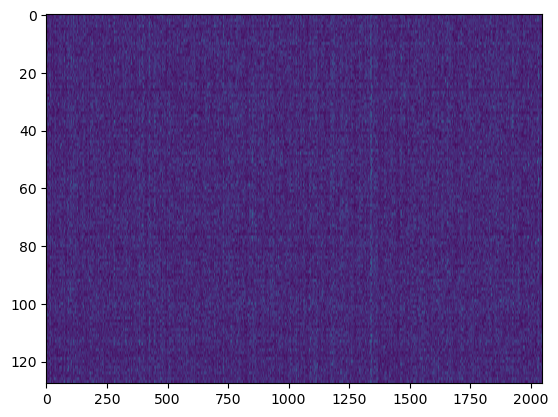

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split2/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.017289311666877902, Accuracy: 0.8571428571428571
Epoch: 50, Loss: 0.0005817044133535859, Accuracy: 0.9217687074829932
Epoch: 100, Loss: 0.00021879117631790589, Accuracy: 0.9224489795918367
Epoch: 150, Loss: 0.00015347321441739188, Accuracy: 0.9142857142857143
Epoch: 200, Loss: 0.00011547811639805635, Accuracy: 0.919047619047619
Epoch: 250, Loss: 8.74320372977123e-05, Accuracy: 0.9231292517006803
Epoch: 300, Loss: 0.00010022777049536151, Accuracy: 0.919047619047619
Epoch: 350, Loss: 6.453434166143692e-05, Accuracy: 0.9217687074829932
Epoch: 400, Loss: 5.874390944325346e-05, Accuracy: 0.9210884353741496
Epoch: 450, Loss: 9.670199724991305e-05, Accuracy: 0.927891156462585
Best Accuracy: 0.927891156462585


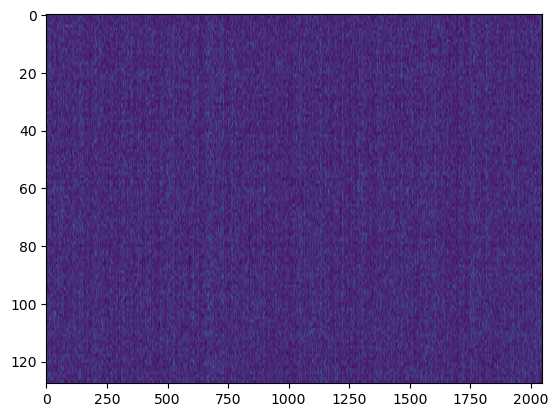

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.020901772793796326, Accuracy: 0.5652777777777778
Epoch: 50, Loss: 0.0023083389943672553, Accuracy: 0.6784722222222223
Epoch: 100, Loss: 0.0013758341937015453, Accuracy: 0.6861111111111111
Epoch: 150, Loss: 0.0009060427132580015, Accuracy: 0.6923611111111111
Epoch: 200, Loss: 0.0006754433270543814, Accuracy: 0.6826388888888889
Epoch: 250, Loss: 0.0005686237437961002, Accuracy: 0.6875
Epoch: 300, Loss: 0.0006009852384320564, Accuracy: 0.6701388888888888
Epoch: 350, Loss: 0.0005623473540051943, Accuracy: 0.6777777777777778
Epoch: 400, Loss: 0.00044437253834783203, Accuracy: 0.6777777777777778
Epoch: 450, Loss: 0.000398167274478409, Accuracy: 0.6777777777777778
Best Accuracy: 0.6923611111111111


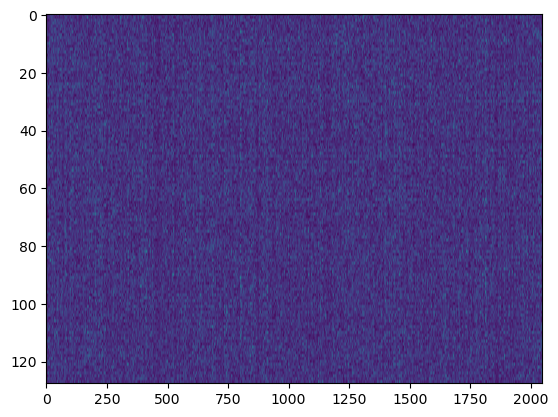

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02143279785911242, Accuracy: 0.5180555555555556
Epoch: 50, Loss: 0.0024339459733002714, Accuracy: 0.6138888888888889
Epoch: 100, Loss: 0.0015020341819359196, Accuracy: 0.6180555555555556
Epoch: 150, Loss: 0.0010254315824972258, Accuracy: 0.6090277777777777
Epoch: 200, Loss: 0.0007407928752298984, Accuracy: 0.6131944444444445
Epoch: 250, Loss: 0.00048681754851713776, Accuracy: 0.6152777777777778
Epoch: 300, Loss: 0.0006053832359611989, Accuracy: 0.6020833333333333
Epoch: 350, Loss: 0.000624654447245929, Accuracy: 0.6027777777777777
Epoch: 400, Loss: 0.0004734736789638797, Accuracy: 0.6076388888888888
Epoch: 450, Loss: 0.00046763866363714137, Accuracy: 0.5993055555555555
Best Accuracy: 0.6180555555555556


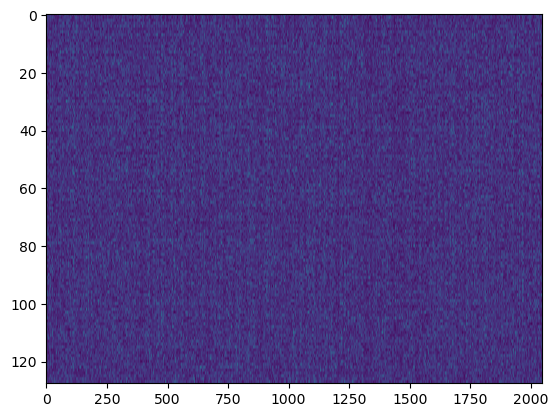

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.015826350988613236, Accuracy: 0.8472222222222222
Epoch: 50, Loss: 0.00031475491252624325, Accuracy: 0.9194444444444444
Epoch: 100, Loss: 0.00015834777247315893, Accuracy: 0.9125
Epoch: 150, Loss: 0.00011759807708181648, Accuracy: 0.9194444444444444
Epoch: 200, Loss: 0.0001086738183706378, Accuracy: 0.9208333333333333
Epoch: 250, Loss: 7.819919733770399e-05, Accuracy: 0.9194444444444444
Epoch: 300, Loss: 0.0001394666884961124, Accuracy: 0.9166666666666666
Epoch: 350, Loss: 0.00011609043495910656, Accuracy: 0.9152777777777777
Epoch: 400, Loss: 4.229247046573113e-05, Accuracy: 0.9145833333333333
Epoch: 450, Loss: 4.406546065891032e-05, Accuracy: 0.9208333333333333
Best Accuracy: 0.9208333333333333


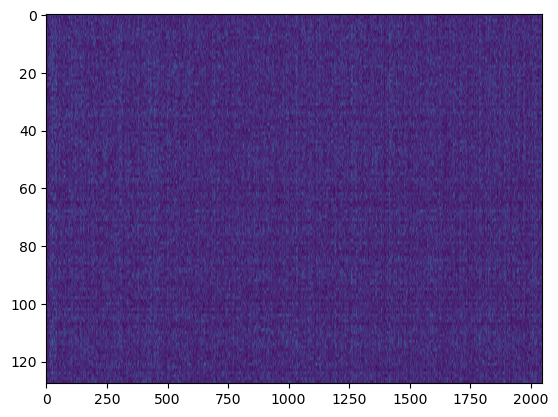

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split3/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.01703673754301336, Accuracy: 0.7972222222222223
Epoch: 50, Loss: 0.0003326059293208851, Accuracy: 0.8979166666666667
Epoch: 100, Loss: 0.00016483461626598403, Accuracy: 0.8979166666666667
Epoch: 150, Loss: 0.00012149125072432474, Accuracy: 0.8965277777777778
Epoch: 200, Loss: 0.00010475198416517943, Accuracy: 0.8972222222222223
Epoch: 250, Loss: 0.00011801341097452677, Accuracy: 0.9
Epoch: 300, Loss: 0.00010562925122535995, Accuracy: 0.9020833333333333
Epoch: 350, Loss: 6.273654435062781e-05, Accuracy: 0.9013888888888889
Epoch: 400, Loss: 6.444336253884507e-05, Accuracy: 0.9013888888888889
Epoch: 450, Loss: 7.49283294175661e-05, Accuracy: 0.9013888888888889
Best Accuracy: 0.9020833333333333


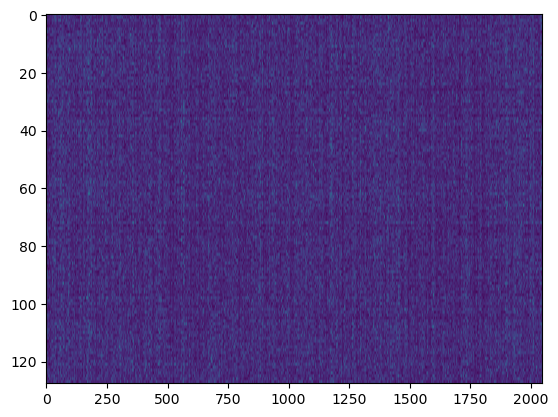

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02119705362452401, Accuracy: 0.6347222222222222
Epoch: 50, Loss: 0.0028384904894563886, Accuracy: 0.7097222222222223
Epoch: 100, Loss: 0.00176606812617845, Accuracy: 0.6923611111111111
Epoch: 150, Loss: 0.001146266950915257, Accuracy: 0.6979166666666666
Epoch: 200, Loss: 0.0009432009330743717, Accuracy: 0.7027777777777777
Epoch: 250, Loss: 0.0005999886715370747, Accuracy: 0.6986111111111111
Epoch: 300, Loss: 0.0006766515680485302, Accuracy: 0.6958333333333333
Epoch: 350, Loss: 0.0005069697812561774, Accuracy: 0.6986111111111111
Epoch: 400, Loss: 0.0005121481423783634, Accuracy: 0.6958333333333333
Epoch: 450, Loss: 0.00041256750215931486, Accuracy: 0.6958333333333333
Best Accuracy: 0.7097222222222223


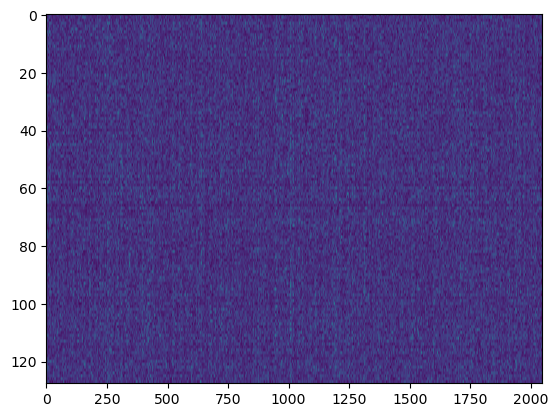

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.02416124277644687, Accuracy: 0.5930555555555556
Epoch: 50, Loss: 0.0030291749267942376, Accuracy: 0.6763888888888889
Epoch: 100, Loss: 0.0016759577776408858, Accuracy: 0.6729166666666667
Epoch: 150, Loss: 0.0011438205889943572, Accuracy: 0.6645833333333333
Epoch: 200, Loss: 0.001018249797117379, Accuracy: 0.6715277777777777
Epoch: 250, Loss: 0.0007737458411914607, Accuracy: 0.6659722222222222
Epoch: 300, Loss: 0.0007390358330061038, Accuracy: 0.6645833333333333
Epoch: 350, Loss: 0.0006886548686048223, Accuracy: 0.6666666666666666
Epoch: 400, Loss: 0.0005423785387797074, Accuracy: 0.6777777777777778
Epoch: 450, Loss: 0.0006685018423013389, Accuracy: 0.6791666666666667
Best Accuracy: 0.6791666666666667


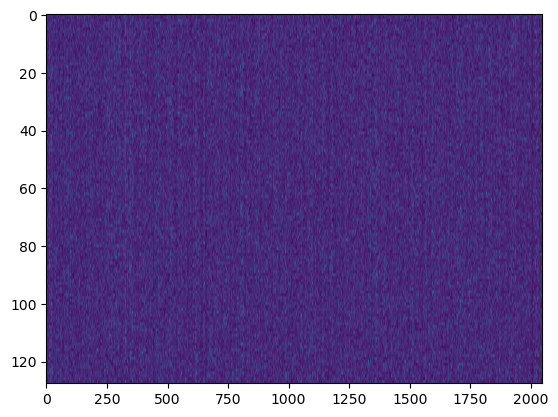

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.016036367374989723, Accuracy: 0.8847222222222222
Epoch: 50, Loss: 0.0003564240559676869, Accuracy: 0.9506944444444444
Epoch: 100, Loss: 0.00024396547394442476, Accuracy: 0.9472222222222222
Epoch: 150, Loss: 0.00015217577084614378, Accuracy: 0.9465277777777777
Epoch: 200, Loss: 0.0001693880990690862, Accuracy: 0.9479166666666666
Epoch: 250, Loss: 0.00010581115396538129, Accuracy: 0.9458333333333333
Epoch: 300, Loss: 7.40971449987329e-05, Accuracy: 0.9506944444444444
Epoch: 350, Loss: 6.193971967149992e-05, Accuracy: 0.9493055555555555
Epoch: 400, Loss: 9.791733084259451e-05, Accuracy: 0.9520833333333333
Epoch: 450, Loss: 0.00010735641060616924, Accuracy: 0.9458333333333333
Best Accuracy: 0.9520833333333333


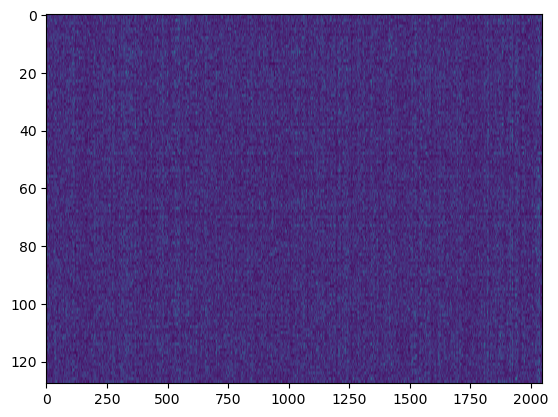

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split4/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.016714322318633398, Accuracy: 0.8743055555555556
Epoch: 50, Loss: 0.0002832481475909137, Accuracy: 0.91875
Epoch: 100, Loss: 0.00015261212797162846, Accuracy: 0.9180555555555555
Epoch: 150, Loss: 0.0001367089487353547, Accuracy: 0.9201388888888888
Epoch: 200, Loss: 0.00012067207992206224, Accuracy: 0.9145833333333333
Epoch: 250, Loss: 8.635710045281383e-05, Accuracy: 0.9180555555555555
Epoch: 300, Loss: 0.00010032775866824927, Accuracy: 0.9180555555555555
Epoch: 350, Loss: 4.63503041424297e-05, Accuracy: 0.9194444444444444
Epoch: 400, Loss: 3.8527024520994426e-05, Accuracy: 0.9194444444444444
Epoch: 450, Loss: 5.2823662432880765e-05, Accuracy: 0.9201388888888888
Best Accuracy: 0.9201388888888888


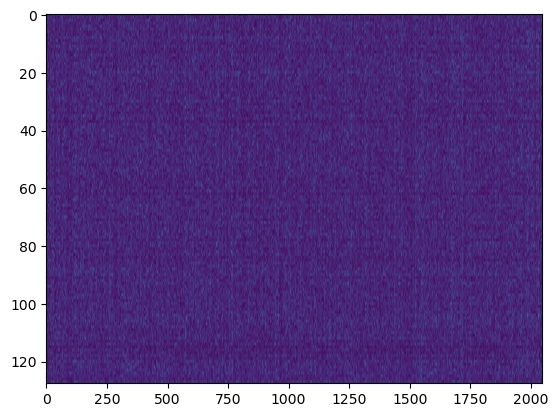

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_sitenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.01386251001130967, Accuracy: 0.6157142857142858
Epoch: 50, Loss: 0.001801329716330483, Accuracy: 0.7171428571428572
Epoch: 100, Loss: 0.0009062583850962775, Accuracy: 0.71
Epoch: 150, Loss: 0.0006547595773424421, Accuracy: 0.7104761904761905
Epoch: 200, Loss: 0.0004983505269601232, Accuracy: 0.7119047619047619
Epoch: 250, Loss: 0.0004440707287618092, Accuracy: 0.709047619047619
Epoch: 300, Loss: 0.0003866238776771795, Accuracy: 0.710952380952381
Epoch: 350, Loss: 0.0003481939798664479, Accuracy: 0.7052380952380952
Epoch: 400, Loss: 0.0002796505755257039, Accuracy: 0.7057142857142857
Epoch: 450, Loss: 0.0003120659894886471, Accuracy: 0.7057142857142857
Best Accuracy: 0.7171428571428572


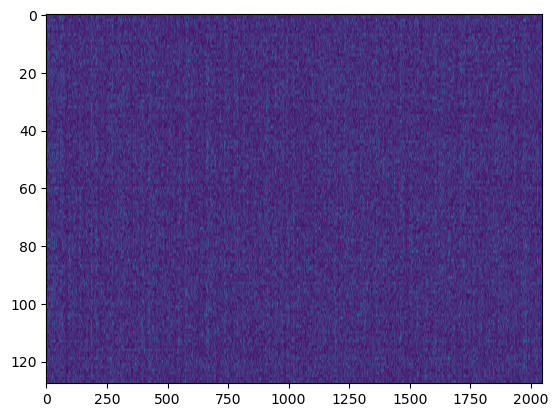

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_wellnorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.015019825583412534, Accuracy: 0.5695238095238095
Epoch: 50, Loss: 0.0016984183021954127, Accuracy: 0.6538095238095238
Epoch: 100, Loss: 0.0009957964292594366, Accuracy: 0.6647619047619048
Epoch: 150, Loss: 0.0006725853291295824, Accuracy: 0.6580952380952381
Epoch: 200, Loss: 0.0005522775667763892, Accuracy: 0.650952380952381
Epoch: 250, Loss: 0.0005173993092917261, Accuracy: 0.6595238095238095
Epoch: 300, Loss: 0.00043737010941618967, Accuracy: 0.6571428571428571
Epoch: 350, Loss: 0.0003914399382968744, Accuracy: 0.6514285714285715
Epoch: 400, Loss: 0.0003453297181321042, Accuracy: 0.6542857142857142
Epoch: 450, Loss: 0.0003192184546164104, Accuracy: 0.6642857142857143
Best Accuracy: 0.6647619047619048


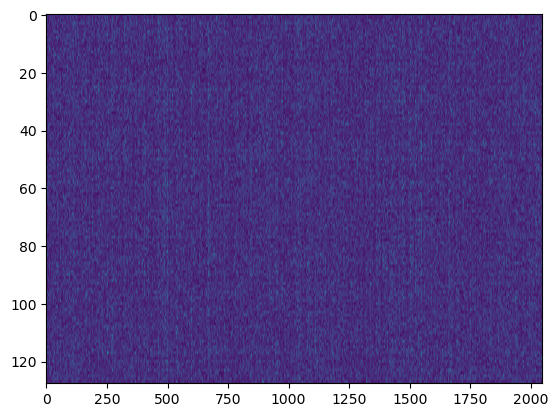

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_dmsonorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.01064752547513871, Accuracy: 0.8738095238095238
Epoch: 50, Loss: 0.0002903382355968157, Accuracy: 0.9457142857142857
Epoch: 100, Loss: 0.00016449956755552973, Accuracy: 0.9376190476190476
Epoch: 150, Loss: 0.0001326086398746286, Accuracy: 0.9442857142857143
Epoch: 200, Loss: 7.655928853810543e-05, Accuracy: 0.9433333333333334
Epoch: 250, Loss: 0.00013354393465089657, Accuracy: 0.9471428571428572
Epoch: 300, Loss: 7.470390942346837e-05, Accuracy: 0.9461904761904761
Epoch: 350, Loss: 4.745377125107639e-05, Accuracy: 0.9385714285714286
Epoch: 400, Loss: 7.173538208007812e-05, Accuracy: 0.9447619047619048
Epoch: 450, Loss: 5.798386764668283e-05, Accuracy: 0.940952380952381
Best Accuracy: 0.9471428571428572


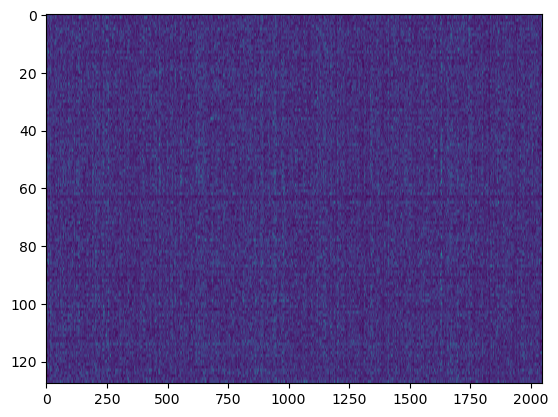

/proj/haste_berzelius/exps/specs_non_grit_based/bf_exps_1_split5/bf_11cls_basic_aug_platenorm_750e_sgd/ResNet_resnet50
Epoch: 0, Loss: 0.010958122752961659, Accuracy: 0.830952380952381
Epoch: 50, Loss: 0.0002739611263608649, Accuracy: 0.8971428571428571
Epoch: 100, Loss: 0.00014629073574074677, Accuracy: 0.900952380952381
Epoch: 150, Loss: 9.005621596727342e-05, Accuracy: 0.8990476190476191
Epoch: 200, Loss: 6.562346426237906e-05, Accuracy: 0.8980952380952381
Epoch: 250, Loss: 6.062925565943477e-05, Accuracy: 0.9004761904761904
Epoch: 300, Loss: 5.150703569164588e-05, Accuracy: 0.9042857142857142
Epoch: 350, Loss: 3.560469857239652e-05, Accuracy: 0.9033333333333333
Epoch: 400, Loss: 6.579746774929975e-05, Accuracy: 0.9023809523809524
Epoch: 450, Loss: 3.2253599381961284e-05, Accuracy: 0.8990476190476191
Best Accuracy: 0.9042857142857142


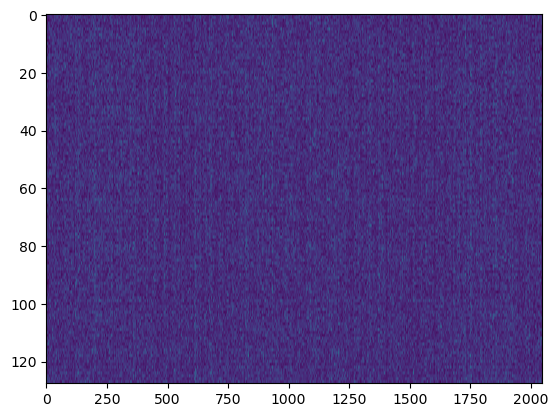

In [5]:
for bf_folder in bf_folders:
    for norm_exp_cat in norm_exp_cats:
        exp_folder = os.path.join(bf_folder, norm_exp_cat, "ResNet_resnet50")
        print(exp_folder)
        if os.path.exists(exp_folder):
            train_df = pd.read_csv(os.path.join(exp_folder, "feature_data_train.csv"))
            test_df = pd.read_csv(os.path.join(exp_folder, "feature_data_test.csv"))

            test_unique_plates = np.unique(test_df["plate"])
            n_labels = len(test_unique_plates)
            train_df = train_df[train_df["plate"].isin(test_unique_plates)]

            le = preprocessing.LabelEncoder()
            le.fit(train_df["plate"])

            train_df["plate_label"] = le.transform(train_df["plate"])
            test_df["plate_label"] = le.transform(test_df["plate"])

            train_X = train_df[[f"fv_{i}" for i in range(2048)]].values
            normalize = preprocessing.StandardScaler().fit(train_X)
            train_X = normalize.transform(train_X)
            train_Y = train_df["plate_label"].values

            test_X = test_df[[f"fv_{i}" for i in range(2048)]].values
            test_X = normalize.transform(test_X)
            test_Y = test_df["plate_label"].values

            outputs, targets = train_plate_cls(
                exp_folder, n_labels, train_X, train_Y, test_X, test_Y, "model", "plate_effect.pth"
            )

            pred_plate = le.inverse_transform(np.concatenate(outputs))
            plate = le.inverse_transform(np.concatenate(targets))

            report = metrics.classification_report(plate, pred_plate, output_dict=True)
            report_df = pd.DataFrame(report).transpose()
            report_df.to_csv(os.path.join(exp_folder, "plate_effect_report.csv"))

            df = pd.DataFrame(
                {
                    "plate": plate,
                    "predicted_plate": pred_plate,
                    "well": test_df["well"].values,
                    "site": test_df["site"].values,
                    "compound": test_df["compound"].values,
                    "moa": test_df["moa"].values,
                }
            )
            df.to_csv(os.path.join(exp_folder, "plate_effect.csv"), index=False)
